In [32]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split, cross_val_score

from sklearn.manifold import TSNE
from sklearn.metrics import r2_score as r2
import warnings
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
import seaborn as sns
import plotly.express as px
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold, GridSearchCV

warnings.filterwarnings('ignore')

In [33]:
from sklearn.preprocessing import StandardScaler

## ЧАСТЬ 1. ПОДГОТОВКА
### Ниже начинается подготовка датасета к дальнейшим операциям с ним

Сначала открываем тренировочный датасет и прописываем путь, куда будем сохранять подготовленный датасет, а также дополнительные датасеты для работы

In [34]:
df = pd.read_csv('project_task/train.csv')
PREPARED_DATASET_PATH = 'project_task/appartement_prepared.csv'
PREPARED_SCALED_PATH = 'project_task/appartement_scaled.csv'
PREDICTION_PATH = 'project_task/prediction.csv'

Сразу создадим функцию для оценки модели

Функция для оценки работы модели
    * Параметры на входе:
    train_target - целевая переменная из тренировочной части датасета
    train_pred - предсказания модели по тренировочной части
    test_target - целевая переменная из тестовой части датасета
    test_pred - предсказания модели по тестовой части
    
    Возвращает:
    R2 на тренировочной и валидационной части, 
    графики зависимости истинных значений от предсказаний

In [35]:
def evaluate_preds(train_target, train_pred, test_target, test_pred):
    
    print("Train R2:\t" + str(round(r2(train_target, train_pred), 3)))
    print("Test R2:\t" + str(round(r2(test_target, test_pred), 3)))
    
    plt.figure(figsize=(18,10))
    
    plt.subplot(121)
    sns.scatterplot(x=train_target, y=train_pred)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    sns.scatterplot(x=test_target, y=test_pred)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')
    plt.show()

Смотрим, что у нас тут вообще происходит

In [36]:
df.head(10)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,NaN,0,11,B,184966.930730
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
3,5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644
5,12915,59,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,B,B,35,7715,4,990.0,0,6,B,215898.447742
6,14549,154,2.0,62.254114,37.160377,7.0,3,5.0,1960,0.460556,B,B,20,4386,14,NaN,1,5,B,296021.204377
7,11993,74,2.0,80.312926,NaN,0.0,14,0.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B,221244.156664
8,5172,1,2.0,64.511437,NaN,1.0,9,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,229102.795999
9,8649,23,1.0,46.461409,18.915552,8.0,13,17.0,2014,0.075779,B,B,6,1437,3,NaN,0,2,B,95380.220993


Смотрим какие данные по столбцам и типы этих данных

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     7887 non-null   float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  object 
 11  Ecology_3      10000 non-null  object 
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

In [38]:
df.dtypes

Id                 int64
DistrictId         int64
Rooms            float64
Square           float64
LifeSquare       float64
KitchenSquare    float64
Floor              int64
HouseFloor       float64
HouseYear          int64
Ecology_1        float64
Ecology_2         object
Ecology_3         object
Social_1           int64
Social_2           int64
Social_3           int64
Healthcare_1     float64
Helthcare_2        int64
Shops_1            int64
Shops_2           object
Price            float64
dtype: object

Все ясно. Есть числовые, есть нечисловые. Но видно также, что количество значений не одинаковое. Проверяем нулевые значения.

In [39]:
df.isnull().sum()

Id                  0
DistrictId          0
Rooms               0
Square              0
LifeSquare       2113
KitchenSquare       0
Floor               0
HouseFloor          0
HouseYear           0
Ecology_1           0
Ecology_2           0
Ecology_3           0
Social_1            0
Social_2            0
Social_3            0
Healthcare_1     4798
Helthcare_2         0
Shops_1             0
Shops_2             0
Price               0
dtype: int64

К счастью, нулевые значения только в пределах числовых типов данных. Ничего страшного, сейчас заменим все нули на медианное значение признака для Healthcare, чтобы удобнее было строить модели. Для Lifesquare постараемся подобраться ближе к искомому значению и установим его в виде разницы площади и кухни

In [40]:
df.loc[df['LifeSquare'].isnull(), 'LifeSquare'] = (df['Square'] - df['KitchenSquare'])
df.loc[df['Healthcare_1'].isnull(), 'Healthcare_1'] = df['Healthcare_1'].median()

Проверяем, что получилось:

In [41]:
df.isnull().sum()

Id               0
DistrictId       0
Rooms            0
Square           0
LifeSquare       0
KitchenSquare    0
Floor            0
HouseFloor       0
HouseYear        0
Ecology_1        0
Ecology_2        0
Ecology_3        0
Social_1         0
Social_2         0
Social_3         0
Healthcare_1     0
Helthcare_2      0
Shops_1          0
Shops_2          0
Price            0
dtype: int64

Отбросим сразу все выбросы значений по трем признакам

In [42]:
df = df[df['LifeSquare'].isnull() |
                    (df['LifeSquare'] < df['LifeSquare'].quantile(.99)) &
                    (df['LifeSquare'] > df['LifeSquare'].quantile(.01))]


df = df[df['KitchenSquare'].isnull() |
                    (df['KitchenSquare'] < df['KitchenSquare'].quantile(.99)) &
                    (df['KitchenSquare'] > df['KitchenSquare'].quantile(.01))]

df = df[df['Square'].isnull() |
                    (df['Square'] < df['Square'].quantile(.99)) &
                    (df['Square'] > df['Square'].quantile(.01))]

# THIS FUNCTION DIDN'T WORK
# def outlaw(train_df, name):
#     return train_df[train_df[name].isnull() |
#                     (train_df[name] < train_df[name].quantile(.99)) &
#                     (train_df[name] > train_df[name].quantile(.01))]

# # outlaw(df, 'LifeSquare')
# outlaw(df, "KitchenSquare")
# # outlaw(df, 'Square')

Еще раз взглянем на данные по датафрейму, чтобы подыскать анолмалии

In [43]:
df.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8.831000e+03,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000
mean,8385.010984,51.973842,1.882686,54.580172,38.904428,6.062734,8.437663,12.788699,4.255307e+03,0.119683,26.110973,5640.057751,8.284792,1038.149360,1.387046,4.434266,213974.043267
std,4873.000113,44.353326,0.819805,15.740811,17.070690,3.490048,5.129263,6.348787,2.133585e+05,0.119650,17.298064,3988.409980,24.011286,769.254041,1.486484,4.816492,87848.013998
min,2.000000,0.000000,0.000000,30.063248,3.434851,1.000000,1.000000,0.000000,1.914000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4152.500000,20.000000,1.000000,41.631571,24.701554,1.000000,4.000000,9.000000,1.972000e+03,0.017647,11.000000,2370.000000,0.000000,810.000000,0.000000,1.000000,156887.643198
50%,8393.000000,39.000000,2.000000,51.615977,35.200267,6.000000,7.000000,13.000000,1.977000e+03,0.075779,25.000000,5562.000000,2.000000,900.000000,1.000000,3.000000,194080.843333
75%,12624.500000,80.000000,2.000000,64.601666,47.603697,9.000000,12.000000,17.000000,2.000000e+03,0.194489,36.000000,7614.000000,5.000000,1036.000000,3.000000,6.000000,249788.675007
max,16798.000000,209.000000,19.000000,102.414647,102.024454,14.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


В этот момент мне пришла генаильная идея, что общая площадь не может быть больше суммы жилой и кухни. Для этих случаев зададим маску и по маске заменим значения общей площади

In [44]:
mask = df["Square"] <= (df["KitchenSquare"] + df["LifeSquare"])
values = df["Square"].values
h_values = df["KitchenSquare"].values + df["LifeSquare"].values
values[mask] = h_values[mask]
df["Square"] = values

In [45]:
df.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,900.0,0,11,B,184966.930730
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
3,5809,58,2.0,61.731512,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
4,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644
5,12915,59,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,B,B,35,7715,4,990.0,0,6,B,215898.447742


In [46]:
df.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8.831000e+03,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000
mean,8385.010984,51.973842,1.882686,54.957360,38.904428,6.062734,8.437663,12.788699,4.255307e+03,0.119683,26.110973,5640.057751,8.284792,1038.149360,1.387046,4.434266,213974.043267
std,4873.000113,44.353326,0.819805,15.880209,17.070690,3.490048,5.129263,6.348787,2.133585e+05,0.119650,17.298064,3988.409980,24.011286,769.254041,1.486484,4.816492,87848.013998
min,2.000000,0.000000,0.000000,30.063248,3.434851,1.000000,1.000000,0.000000,1.914000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4152.500000,20.000000,1.000000,41.947020,24.701554,1.000000,4.000000,9.000000,1.972000e+03,0.017647,11.000000,2370.000000,0.000000,810.000000,0.000000,1.000000,156887.643198
50%,8393.000000,39.000000,2.000000,51.991064,35.200267,6.000000,7.000000,13.000000,1.977000e+03,0.075779,25.000000,5562.000000,2.000000,900.000000,1.000000,3.000000,194080.843333
75%,12624.500000,80.000000,2.000000,64.987107,47.603697,9.000000,12.000000,17.000000,2.000000e+03,0.194489,36.000000,7614.000000,5.000000,1036.000000,3.000000,6.000000,249788.675007
max,16798.000000,209.000000,19.000000,111.978514,102.024454,14.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


Проверим, что с комнатами:

In [47]:
df['Rooms'].sort_values().unique()

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6., 10., 19.])

Стало ясно, что есть значения, не соответствующие действительности (0,10,19) и мешающие нам (6), т.к. они мешают общей калькуляции данных. Исправляем это!

In [48]:
df.loc[df['Rooms'].isin([0, 6, 10, 19]), 'Rooms'] = df['Rooms'].median()
df['Rooms'].value_counts()

2.0    3538
1.0    3235
3.0    1956
4.0      98
5.0       4
Name: Rooms, dtype: int64

Теперь проверим года постройки дома

In [49]:
df['HouseYear'].sort_values().unique()

array([    1914,     1917,     1918,     1919,     1928,     1929,
           1930,     1931,     1932,     1933,     1934,     1935,
           1936,     1937,     1938,     1939,     1940,     1941,
           1942,     1947,     1948,     1950,     1951,     1952,
           1953,     1954,     1955,     1956,     1957,     1958,
           1959,     1960,     1961,     1962,     1963,     1964,
           1965,     1966,     1967,     1968,     1969,     1970,
           1971,     1972,     1973,     1974,     1975,     1976,
           1977,     1978,     1979,     1980,     1981,     1982,
           1983,     1984,     1985,     1986,     1987,     1988,
           1989,     1990,     1991,     1992,     1993,     1994,
           1995,     1996,     1997,     1998,     1999,     2000,
           2001,     2002,     2003,     2004,     2005,     2006,
           2007,     2008,     2009,     2010,     2011,     2012,
           2013,     2014,     2015,     2016,     2017,     2

Исправим выбивающиеся данные на те, которые имелись в виду (на мой взгляд)

In [50]:
df['HouseYear'] = df['HouseYear'].replace([4968],1968)
df['HouseYear'] = df['HouseYear'].replace([20052011],2005)

Проверям, все ли прошло гладко

In [51]:
df['HouseYear'].sort_values().unique()

array([1914, 1917, 1918, 1919, 1928, 1929, 1930, 1931, 1932, 1933, 1934,
       1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1947, 1948, 1950,
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005,
       2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016,
       2017, 2018, 2019, 2020])

Осталось совсем немного - это этажи

In [52]:
df['Floor'].sort_values().unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33, 42])

Сразу сделаем маску, которая заменит те значения, которые превышают количество этажей в доме, заменяя их на последний возможный этаж

In [53]:
mask = df["Floor"] > df["HouseFloor"]
values = df["Floor"].values
h_values = df["HouseFloor"].values
values[mask] = h_values[mask]
df["Floor"] = values

In [54]:
df.tail(10)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
9990,15233,1,3.0,57.373889,39.688445,5.0,2,5.0,1962,0.036270,B,B,6,1318,1,200.0,1,1,B,163807.542987
9991,11553,3,3.0,101.622794,51.628780,12.0,17,17.0,2000,0.265089,B,B,37,5288,0,1937.0,3,2,B,212883.501504
9992,14333,150,3.0,78.249637,49.385096,10.0,5,16.0,1976,0.300323,B,B,52,10311,6,900.0,1,9,B,342418.758888
9993,48,13,3.0,80.631333,48.899083,10.0,11,14.0,1999,0.090799,B,B,74,19083,2,900.0,5,15,B,350684.628560
9994,4158,23,2.0,64.864198,63.864198,1.0,17,17.0,1977,0.075779,B,B,6,1437,3,900.0,0,2,B,171323.515653
9995,77,32,2.0,50.401785,30.476203,5.0,5,5.0,1968,0.135650,B,B,46,7960,6,350.0,3,11,B,196684.316040
9996,6159,18,1.0,41.521546,20.539216,9.0,13,13.0,2000,0.000000,B,B,30,5562,0,900.0,0,5,A,189050.289571
9997,5123,27,1.0,47.939008,46.939008,1.0,12,16.0,2015,0.072158,B,B,2,629,1,900.0,0,0,A,159143.805370
9998,5400,75,2.0,43.602562,33.840147,8.0,1,5.0,1961,0.307467,B,A,30,5048,9,325.0,2,5,B,181595.339808
9999,6306,128,1.0,38.666645,21.157874,8.0,7,17.0,1990,0.000000,B,B,27,4798,0,30.0,2,8,B,218714.077615


Вот мы и подошли к нечисловым данным. Я уже работал с этим датасетом и пытался все делать через get_dummies, поэтому спойлер - их всего два типа А и В. Так что преобразуем их в тип 0 и 1, а ненужные столбцы просто выбросим

In [55]:
df['Ecology_2_bin'] = df['Ecology_2'].replace({'A':0, 'B':1})
df['Ecology_3_bin'] = df['Ecology_3'].replace({'A':0, 'B':1})
df['Shops_2_bin'] = df['Shops_2'].replace({'A':0, 'B':1})
df = df.drop(['Ecology_2', 'Ecology_3' , 'Shops_2'], axis=1)

In [56]:
df.tail(10)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price,Ecology_2_bin,Ecology_3_bin,Shops_2_bin
9990,15233,1,3.0,57.373889,39.688445,5.0,2,5.0,1962,0.036270,6,1318,1,200.0,1,1,163807.542987,1,1,1
9991,11553,3,3.0,101.622794,51.628780,12.0,17,17.0,2000,0.265089,37,5288,0,1937.0,3,2,212883.501504,1,1,1
9992,14333,150,3.0,78.249637,49.385096,10.0,5,16.0,1976,0.300323,52,10311,6,900.0,1,9,342418.758888,1,1,1
9993,48,13,3.0,80.631333,48.899083,10.0,11,14.0,1999,0.090799,74,19083,2,900.0,5,15,350684.628560,1,1,1
9994,4158,23,2.0,64.864198,63.864198,1.0,17,17.0,1977,0.075779,6,1437,3,900.0,0,2,171323.515653,1,1,1
9995,77,32,2.0,50.401785,30.476203,5.0,5,5.0,1968,0.135650,46,7960,6,350.0,3,11,196684.316040,1,1,1
9996,6159,18,1.0,41.521546,20.539216,9.0,13,13.0,2000,0.000000,30,5562,0,900.0,0,5,189050.289571,1,1,0
9997,5123,27,1.0,47.939008,46.939008,1.0,12,16.0,2015,0.072158,2,629,1,900.0,0,0,159143.805370,1,1,0
9998,5400,75,2.0,43.602562,33.840147,8.0,1,5.0,1961,0.307467,30,5048,9,325.0,2,5,181595.339808,1,0,1
9999,6306,128,1.0,38.666645,21.157874,8.0,7,17.0,1990,0.000000,27,4798,0,30.0,2,8,218714.077615,1,1,1


##### Добавление новых измерительных признаков

У нас есть очень интересная, но абсолютно бесполезная переменная номера района. Сейчас мы выжмем из нее все.

district_size - это переменная, измеряющая количество квартир в районе. Она нам не очень поможет, но больше лучше, чем меньше

In [57]:
district_size = df['DistrictId'].value_counts().reset_index()\
               .rename(columns={'index':'DistrictId', 'DistrictId':'DistrictSize'})
df = df.merge(district_size, on='DistrictId', how='left')
df.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,...,7976,5,900.0,0,11,184966.930730,1,1,1,20
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,...,10309,1,240.0,1,16,300009.450063,1,1,1,85
2,5809,58,2.0,61.731512,52.731512,9.0,8,17.0,1977,0.437885,...,5735,3,1084.0,0,5,175616.227217,1,1,1,148
3,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,...,5776,1,2078.0,2,4,150226.531644,1,1,1,95
4,12915,59,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,...,7715,4,990.0,0,6,215898.447742,1,1,1,49


Для моего следующего признака посчитаем стоимость квадратного метра в каждой квартире

In [58]:
df['SquarePrice'] = (df['Price'].values / df['Square'].values)
df.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize,SquarePrice
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,...,5,900.0,0,11,184966.930730,1,1,1,20,3854.958571
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,...,1,240.0,1,16,300009.450063,1,1,1,85,4567.491245
2,5809,58,2.0,61.731512,52.731512,9.0,8,17.0,1977,0.437885,...,3,1084.0,0,5,175616.227217,1,1,1,148,2844.839230
3,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,...,1,2078.0,2,4,150226.531644,1,1,1,95,3788.892642
4,12915,59,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,...,4,990.0,0,6,215898.447742,1,1,1,49,2685.822560


И на основании средней цены сделаем расчет средней стоимости квадратного метра в том или ином районе

In [59]:
avg_price_dis = df.groupby(['DistrictId'], as_index=False).agg({'SquarePrice':'mean'})\
                       .rename(columns={'SquarePrice':'Square_Dis'})
df = df.merge(avg_price_dis, on='DistrictId', how='left')
df.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Healthcare_1,Helthcare_2,Shops_1,Price,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize,SquarePrice,Square_Dis
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,...,900.0,0,11,184966.930730,1,1,1,20,3854.958571,4377.771222
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,...,240.0,1,16,300009.450063,1,1,1,85,4567.491245,4266.020811
2,5809,58,2.0,61.731512,52.731512,9.0,8,17.0,1977,0.437885,...,1084.0,0,5,175616.227217,1,1,1,148,2844.839230,3079.748580
3,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,...,2078.0,2,4,150226.531644,1,1,1,95,3788.892642,3907.229310
4,12915,59,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,...,990.0,0,6,215898.447742,1,1,1,49,2685.822560,4720.620805


Этот великолепный признак рассчитывает медианное значение цены на разные типы квартир в районе

In [60]:
med_price_by_district = df.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByDistrict'})

df = df.merge(med_price_by_district, on=['DistrictId', 'Rooms'], how='left')
df.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Helthcare_2,Shops_1,Price,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize,SquarePrice,Square_Dis,MedPriceByDistrict
0,14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,...,0,11,184966.930730,1,1,1,20,3854.958571,4377.771222,203384.328026
1,15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,...,1,16,300009.450063,1,1,1,85,4567.491245,4266.020811,297041.145784
2,5809,58,2.0,61.731512,52.731512,9.0,8,17.0,1977,0.437885,...,0,5,175616.227217,1,1,1,148,2844.839230,3079.748580,169246.115943
3,10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,...,2,4,150226.531644,1,1,1,95,3788.892642,3907.229310,158791.017955
4,12915,59,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,...,0,6,215898.447742,1,1,1,49,2685.822560,4720.620805,324441.970715


Поматросили и бросили. Шутка. Просто эти данные нам больше не понадобятся

In [61]:
df = df.drop(['Id' , 'DistrictId'], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8831 entries, 0 to 8830
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Rooms               8831 non-null   float64
 1   Square              8831 non-null   float64
 2   LifeSquare          8831 non-null   float64
 3   KitchenSquare       8831 non-null   float64
 4   Floor               8831 non-null   int64  
 5   HouseFloor          8831 non-null   float64
 6   HouseYear           8831 non-null   int64  
 7   Ecology_1           8831 non-null   float64
 8   Social_1            8831 non-null   int64  
 9   Social_2            8831 non-null   int64  
 10  Social_3            8831 non-null   int64  
 11  Healthcare_1        8831 non-null   float64
 12  Helthcare_2         8831 non-null   int64  
 13  Shops_1             8831 non-null   int64  
 14  Price               8831 non-null   float64
 15  Ecology_2_bin       8831 non-null   int64  
 16  Ecolog

Теперь нужно посмотреть были ли еще выбросы и аномалии по значениям. Есть логичная идея по разбиению этих данных на подгруппы, а именно соотношение цены со следующими КОЛИЧЕСТВЕННЫМИ признаками:

1. DistrictSize, SquarePrice, Square_Dis, MedPriceByDistrict (Количественное значение)
2. Rooms, Square, LifeSquare, KitchenSquare (Количественное значение)
2. Floor, HouseFloor (Количественное значение)
3. HouseYear (Неколичечественное значение)
4. Ecology_1 (Количечественное значение)
5. Social_1, Social_2, Social_3 (Количечественное значение)
6. Healthcare_1, Helthcare_2 (Неколичечественное значение)
7. Shops_1 (Неколичечественное значение)

### Price | DistrictSize, SquarePrice, Square_Dis, MedPriceByDistrict

Самые интересные закономерности мы видим в SquarePrice и MedPricebyDisctrict, где видны прямые закономерности. Чуть менее выражено это в случае с Square_Dis. Однако, прямая корреляция, хоть и поверхностная, наблюдается.

In [62]:
check_1 = df[['Price','DistrictSize', 'SquarePrice', 'Square_Dis', 'MedPriceByDistrict']]

px.scatter_matrix(check_1, dimensions = ['Price','DistrictSize', 'SquarePrice', 'Square_Dis', 'MedPriceByDistrict'], color="Price").update_traces(diagonal_visible=False)

### Price | Rooms, Square, LifeSquare, KitchenSquare 

Какие либо прямые закономерности отсутствуют. Да, чем больше жилой площади, тем больше стоимость. Но эта закономерность видна только на недорогих квартирах.

In [63]:
check_2 = df[['Price','Rooms', 'Square', 'LifeSquare', 'KitchenSquare']]

px.scatter_matrix(check_2, dimensions = ['Price','Rooms', 'Square', 'LifeSquare', 'KitchenSquare'], color="Price").update_traces(diagonal_visible=False)

### Price | Floor, HouseFloor

Закономерности отсутствуют

In [64]:
check_2_2 = df[['Price', 'Floor', 'HouseFloor']]

px.scatter_matrix(check_2_2, dimensions = ['Price', 'Floor', 'HouseFloor'], color="Price").update_traces(diagonal_visible=False)

### Price | HouseYear

Закономерности отсутствуют, недвижимость может стоить дорого в старом доме и дешево в новом

In [65]:
check_3 = df[['Price','HouseYear']]

px.scatter_matrix(check_3, dimensions = ['Price','HouseYear'], color="Price").update_traces(diagonal_visible=False)

### Price | Ecology_1

Есть некоторые совпадния, что самая дорогая недвижимость имеет выше индекс Экологии_1

In [66]:
check_4 = df[['Price','Ecology_1']]

px.scatter_matrix(check_4, dimensions = ['Price','Ecology_1'], color="Price").update_traces(diagonal_visible=False)

### Price | Healthcare_1, Healthcare_2

Нет никаких закономерностей

In [67]:
check_5 = df[['Price','Healthcare_1', 'Helthcare_2']]

px.scatter_matrix(check_5, dimensions = ['Price','Healthcare_1', 'Helthcare_2'], color="Price").update_traces(diagonal_visible=False)

### Price | Social_1, Social_2, Social_3

На этом графике видно, что цена почти не меняется, однако зависимость Social_1 и Social_2 является практически полной

In [68]:
check_6 = df[['Price','Social_1', 'Social_2', 'Social_3']]

px.scatter_matrix(check_6, dimensions = ['Price','Social_1', 'Social_2', 'Social_3'], color="Price").update_traces(diagonal_visible=False)

### Price | Shops_1

Опять ничего!

In [69]:
check_6 = df[['Price','Shops_1']]

px.scatter_matrix(check_6, dimensions = ['Price','Shops_1'], color="Price").update_traces(diagonal_visible=False)

In [70]:
df.describe()

,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,...,Helthcare_2,Shops_1,Price,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize,SquarePrice,Square_Dis,MedPriceByDistrict
count,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,...,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000,8831.000000
mean,1.878723,54.957360,38.904428,6.062734,7.831956,12.788699,1984.555996,0.119683,26.110973,5640.057751,...,1.387046,4.434266,213974.043267,0.989922,0.969992,0.928547,181.291926,3953.719664,3953.719664,211703.131379
std,0.788444,15.880209,17.070690,3.490048,5.108790,6.348787,18.367952,0.119650,17.298064,3988.409980,...,1.486484,4.816492,87848.013998,0.099888,0.170619,0.257594,194.725810,1230.874276,925.052993,71697.953845
min,1.000000,30.063248,3.434851,1.000000,0.000000,0.000000,1914.000000,0.000000,0.000000,168.000000,...,0.000000,0.000000,59174.778028,0.000000,0.000000,0.000000,1.000000,752.588644,2298.233739,78030.684516
25%,1.000000,41.947020,24.701554,1.000000,4.000000,9.000000,1972.000000,0.017647,11.000000,2370.000000,...,0.000000,1.000000,156887.643198,1.000000,1.000000,1.000000,49.000000,3005.795989,3179.115524,165478.896000
50%,2.000000,51.991064,35.200267,6.000000,7.000000,13.000000,1977.000000,0.075779,25.000000,5562.000000,...,1.000000,3.000000,194080.843333,1.000000,1.000000,1.000000,90.000000,4011.055070,4094.146661,197795.571830
75%,2.000000,64.987107,47.603697,9.000000,11.000000,17.000000,2000.000000,0.194489,36.000000,7614.000000,...,3.000000,6.000000,249788.675007,1.000000,1.000000,1.000000,279.000000,4719.962912,4495.797742,242298.108379
max,5.000000,111.978514,102.024454,14.000000,42.000000,117.000000,2020.000000,0.521867,74.000000,19083.000000,...,6.000000,23.000000,633233.466570,1.000000,1.000000,1.000000,631.000000,11854.652892,9452.113505,624156.003381


Мы великолепны. Сохраняем подготовленный датасет в директорию.

In [74]:
df.to_csv(PREPARED_DATASET_PATH, index=False, encoding='utf-8')

Сразу готовим списки интересующих нас критериев. Т.к. я пишу это уже после сдачи курсового проекта, то не изменяю данные. Однако, я бы удалил некоторые признаки из выборки для обучения

In [75]:
feature_names = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor', 'HouseYear',
                 'Ecology_1', 'Ecology_2_bin', 'Ecology_3_bin', 'Social_1', 'Social_2', 'Social_3',
                 'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2_bin', 'DistrictSize', 'Square_Dis', 'MedPriceByDistrict']

target_name = 'Price'

То, что находится ниже - просто технические разборки в рамках того, что я пытался разобраться с fit, tranform и обратной нормализацией данных

In [76]:
len(feature_names)

20

In [77]:
f_keys = feature_names.copy()
f_keys.append('Price')
f_keys.append('SquarePrice')
b_keys = feature_names.copy()
b_keys.append('SquarePrice')
f_keys

['Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2_bin',
 'Ecology_3_bin',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2_bin',
 'DistrictSize',
 'Square_Dis',
 'MedPriceByDistrict',
 'Price',
 'SquarePrice']

In [78]:
df.head()

,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,...,Helthcare_2,Shops_1,Price,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize,SquarePrice,Square_Dis,MedPriceByDistrict
0,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,33,7976,...,0,11,184966.930730,1,1,1,20,3854.958571,4377.771222,203384.328026
1,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,46,10309,...,1,16,300009.450063,1,1,1,85,4567.491245,4266.020811,297041.145784
2,2.0,61.731512,52.731512,9.0,8,17.0,1977,0.437885,23,5735,...,0,5,175616.227217,1,1,1,148,2844.839230,3079.748580,169246.115943
3,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,35,5776,...,2,4,150226.531644,1,1,1,95,3788.892642,3907.229310,158791.017955
4,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,35,7715,...,0,6,215898.447742,1,1,1,49,2685.822560,4720.620805,324441.970715


In [79]:
pibody = df.copy()
pibody = pibody.drop(['Price', 'SquarePrice'], axis=1)
pibody.head()

,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize,Square_Dis,MedPriceByDistrict
0,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,33,7976,5,900.0,0,11,1,1,1,20,4377.771222,203384.328026
1,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,46,10309,1,240.0,1,16,1,1,1,85,4266.020811,297041.145784
2,2.0,61.731512,52.731512,9.0,8,17.0,1977,0.437885,23,5735,3,1084.0,0,5,1,1,1,148,3079.748580,169246.115943
3,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,35,5776,1,2078.0,2,4,1,1,1,95,3907.229310,158791.017955
4,3.0,80.384479,46.683720,12.0,5,17.0,2011,0.309479,35,7715,4,990.0,0,6,1,1,1,49,4720.620805,324441.970715


Чуть ниже я нормализовал данные для того, поскольку на нормализованных данных гораздо лучше работала модель, добавляя около 0.05 r2

In [80]:
scaler = StandardScaler()
scaling = scaler.fit_transform(pibody.astype(float))
scaled = pd.DataFrame(scaling, columns=feature_names)

scaled.head()

,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2_bin,Ecology_3_bin,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2_bin,DistrictSize,Square_Dis,MedPriceByDistrict
0,0.153827,-0.439301,-0.554296,-0.017976,-0.162857,-0.596793,-0.846958,-0.256118,0.398277,0.585716,-0.136810,-0.179599,-0.933158,1.363255,0.1009,0.175887,0.277401,-0.828350,0.458434,-0.116032
1,1.422220,0.675488,0.067085,0.555114,-0.162857,-0.596793,-0.356946,-0.999742,1.149849,1.170694,-0.303408,-1.037622,-0.260391,2.401414,0.1009,0.175887,0.277401,-0.494528,0.337623,1.190311
2,0.153827,0.426602,0.810036,0.841660,0.032895,0.663361,-0.411392,2.659593,-0.179855,0.023806,-0.220109,0.059607,-0.933158,0.117464,0.1009,0.175887,0.277401,-0.170978,-0.944833,-0.592198
3,-1.114566,-0.964032,-0.886263,0.268569,0.620152,-0.124235,-0.465837,-0.897196,0.513903,0.034086,-0.303408,1.351841,0.412375,-0.090167,0.1009,0.175887,0.277401,-0.443171,-0.050260,-0.738028
4,1.422220,1.601274,0.455736,1.701295,-0.554361,0.663361,1.439763,1.586352,0.513903,0.520272,-0.178459,-0.062596,-0.933158,0.325096,0.1009,0.175887,0.277401,-0.679414,0.829082,1.572503


In [81]:
scaled.to_csv(PREPARED_SCALED_PATH, index=False, encoding='utf-8')

## ЧАСТЬ 2. ОБУЧЕНИЕ

Для начала загрузим наш подготовленный датасет

In [82]:
apparts = pd.read_csv('project_task/appartement_scaled.csv')


# feature_names = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor', 'HouseYear',
#                  'Ecology_1', 'Ecology_2_bin', 'Ecology_3_bin', 'Social_1', 'Social_2', 'Social_3',
#                  'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2_bin', 'DistrictSize', 'Square_Dis', 'MedPriceByDistrict']

# target_name = 'Price'

Установим, что Х - это признаки, которые мы указали, а у - это цель, то есть цена

In [83]:
X = apparts[feature_names]
y = df[target_name]

Разложим датасет на тест и тренировку

In [439]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33, shuffle=True, random_state=42)

#### RandomForestRegressor
Я делал наибольше ставки на него и при этом он показывает иногда лучшие результаты. Но из-за меньшего значения r2 в среднем пришлось отказаться от него. Мне нравится эта функция, т.к. она создает множество ветвей при помощи разных частей датасетов перед тем, как дает ответ. Меня эта идея восхищает

In [440]:
regr = RandomForestRegressor(n_estimators=100, max_depth=100, random_state=42).fit(X_train, y_train)

In [441]:
y_pred_train = regr.predict(X_train)
y_pred = regr.predict(X_test)

Делаем кроссвалидацию

In [442]:
cv_score = cross_val_score(regr, X, y, scoring='r2', cv=KFold(n_splits=5, shuffle=True, random_state=42))
cv_score

array([0.74274968, 0.76128802, 0.71691417, 0.76092957, 0.76864728])

Train R2:	0.964
Test R2:	0.743


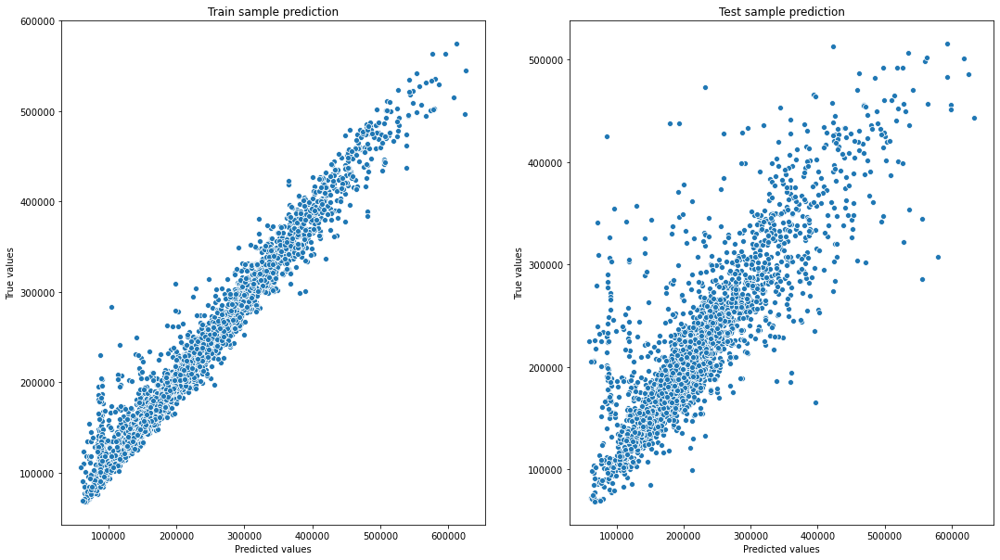

In [443]:
evaluate_preds(y_train, y_pred_train, y_test, y_pred)

Смотрим на то, какой признак больше всех повлиял. Конечно, тот, который мы рассмотрели на вебинаре дал невероятный вес. Однако, я рад, что сделал бронзовый признак :)

In [444]:
feature_importances = pd.DataFrame(zip(X_train.columns, regr.feature_importances_), 
                                   columns=['feature_name', 'importance'])

feature_importances.sort_values(by='importance', ascending=False)

,feature_name,importance
19,MedPriceByDistrict,0.619783
1,Square,0.105005
18,Square_Dis,0.058196
2,LifeSquare,0.033525
6,HouseYear,0.031439
4,Floor,0.021477
5,HouseFloor,0.020972
3,KitchenSquare,0.019049
7,Ecology_1,0.012828
10,Social_1,0.012620


##### Linear Regression
Линейная регрессия. На нее обычно мало надежды, но для общей картины, она хорошо вписывается. У нее достаточно хорошие результаты на нормализованных данных. Плюс сама идея линейной регрессии мне кажется самой понятной.

In [445]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [446]:
y_pred_train = lr.predict(X_train)
y_pred = lr.predict(X_test)

Кроссвалидация

In [447]:
cv_score = cross_val_score(lr, X, y, scoring='r2', cv=KFold(n_splits=5, shuffle=True, random_state=42))
cv_score

array([0.7259124 , 0.71248973, 0.68527819, 0.71742793, 0.72668014])

Train R2:	0.717
Test R2:	0.713


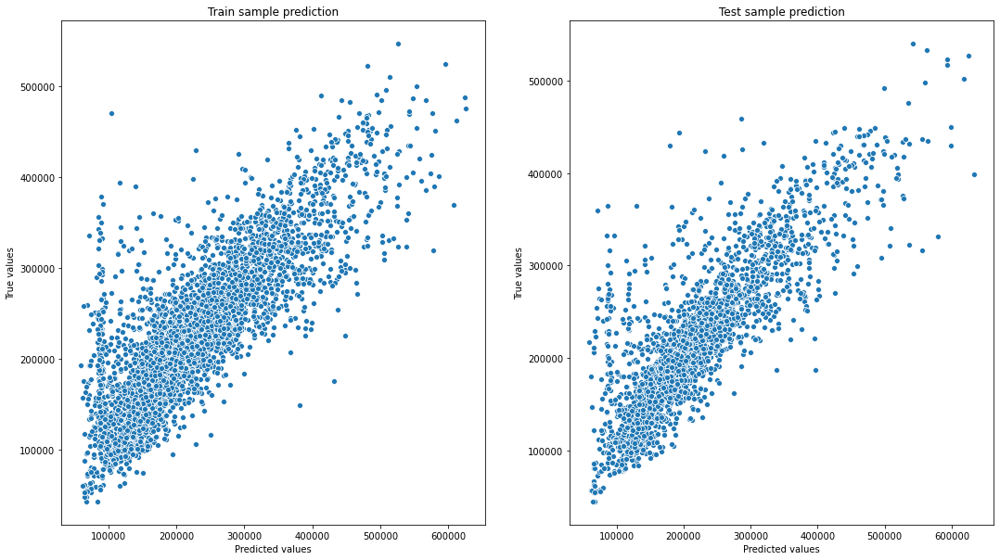

In [448]:
evaluate_preds(y_train, y_pred_train, y_test, y_pred)

У самой регрессии не самые плохие данные, она дает неплохой результат и тренировка не сильно отличается от теста. Также разброс вполне себе в пределах нормы

In [449]:
check_test = pd.DataFrame({
    "y_test": y_test,
    "y_pred": y_pred.flatten(),
})

check_test.head(10)

,y_test,y_pred
1010,174590.373323,168398.234275
8351,283312.670991,235115.330018
6084,203858.095745,203291.253969
2868,478782.488421,445407.243196
6618,236804.280037,231176.437753
1295,266008.977451,316455.550055
4174,169061.669560,198540.723606
932,125817.709455,139338.950616
4092,228361.065203,264041.461096
2446,194175.395111,187445.324272


###### KNeighborsRegressor

Эта функция также очень и очень интересная. Ее суть мне нравится в части выбора наиболее вероятного решения. Конечно, в отношении недвижимости использование функции не лучший выбор, т.к. сам рынок недвижимости мало предсказуем и даже хорошие результаты в жизни маловероятно, что будут использованы. Но если завтра придется делать автопилот для машины, то у этой функции больши шансы оказаться в моем коде

In [450]:
knr = KNeighborsRegressor(n_neighbors=2).fit(X_train, y_train)

In [451]:
y_pred_train = knr.predict(X_train)
y_pred = knr.predict(X_test)

Кроссвалидация

In [452]:
cv_score = cross_val_score(knr, X, y, scoring='r2', cv=KFold(n_splits=5, shuffle=True, random_state=42))
cv_score

array([0.67811655, 0.62570314, 0.61364983, 0.66016714, 0.6444785 ])

Train R2:	0.885
Test R2:	0.65


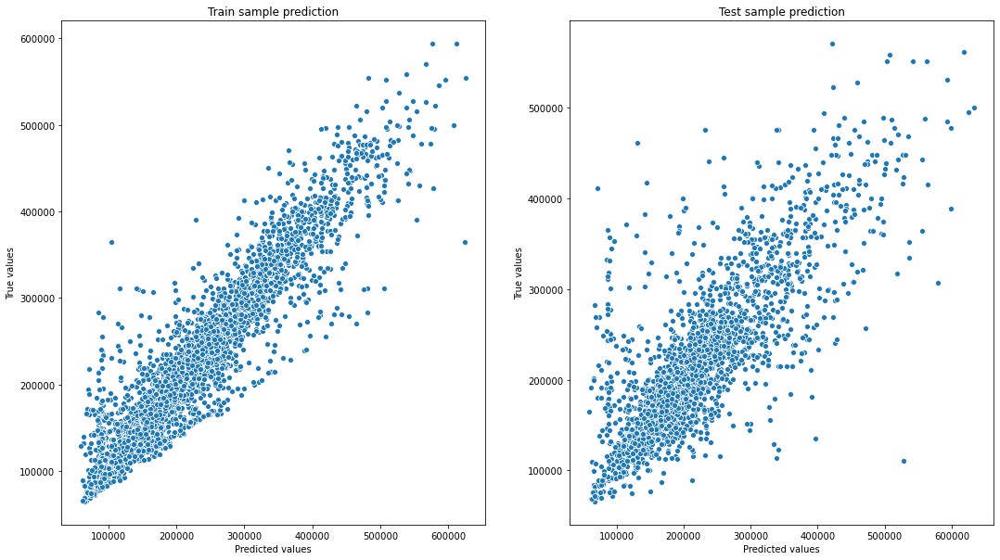

In [453]:
evaluate_preds(y_train, y_pred_train, y_test, y_pred)

###### GradientBoostingRegressor
Мои мысли насчет градиентного бустинга - я бы постарался провести его над дереьвям, чтобы улучшить результаты, но мне бы еще поучиться, как все это делать. 

In [454]:
gbr = GradientBoostingRegressor(random_state=42, n_estimators=322)
gbr.fit(X_train, y_train)

GradientBoostingRegressor(n_estimators=322, random_state=42)

In [455]:
y_pred_train = gbr.predict(X_train)
y_pred = gbr.predict(X_test)

Кроссвалидация

In [456]:
cv_score = cross_val_score(gbr, X, y, scoring='r2', cv=KFold(n_splits=5, shuffle=True, random_state=42))
cv_score

array([0.75718679, 0.75192006, 0.70324853, 0.7545291 , 0.7766649 ])

Train R2:	0.852
Test R2:	0.746


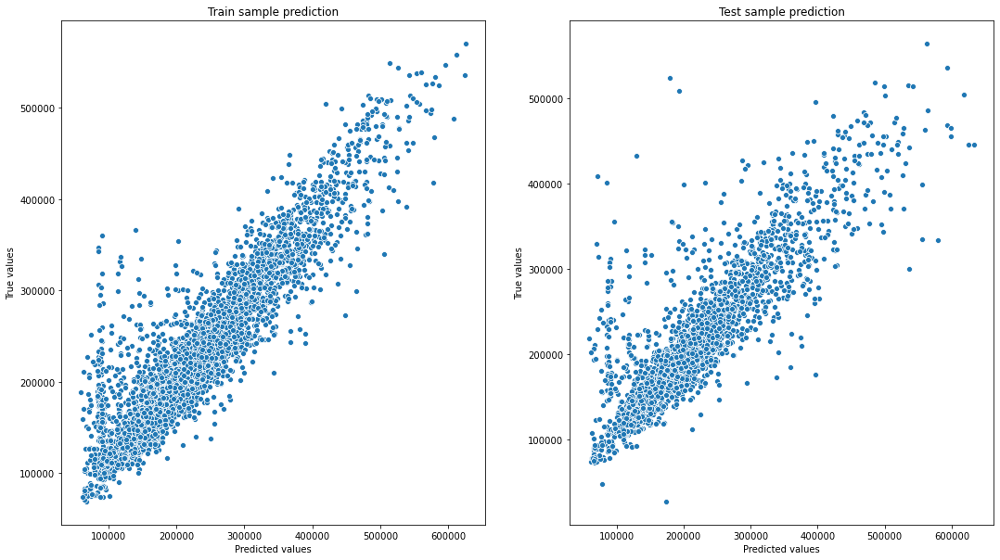

In [457]:
evaluate_preds(y_train, y_pred_train, y_test, y_pred)

### ПОДГОТОВКА ТЕСТОВОГО ДАТАСЕТА

Ниже я буду +- повторять все то, что делал с предыдущим датасетом, т.к. аномалии в нем практически идентичные

In [458]:
dt = pd.read_csv('project_task/test.csv')

In [459]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             5000 non-null   int64  
 1   DistrictId     5000 non-null   int64  
 2   Rooms          5000 non-null   float64
 3   Square         5000 non-null   float64
 4   LifeSquare     3959 non-null   float64
 5   KitchenSquare  5000 non-null   float64
 6   Floor          5000 non-null   int64  
 7   HouseFloor     5000 non-null   float64
 8   HouseYear      5000 non-null   int64  
 9   Ecology_1      5000 non-null   float64
 10  Ecology_2      5000 non-null   object 
 11  Ecology_3      5000 non-null   object 
 12  Social_1       5000 non-null   int64  
 13  Social_2       5000 non-null   int64  
 14  Social_3       5000 non-null   int64  
 15  Healthcare_1   2623 non-null   float64
 16  Helthcare_2    5000 non-null   int64  
 17  Shops_1        5000 non-null   int64  
 18  Shops_2 

In [460]:
dt.dtypes

Id                 int64
DistrictId         int64
Rooms            float64
Square           float64
LifeSquare       float64
KitchenSquare    float64
Floor              int64
HouseFloor       float64
HouseYear          int64
Ecology_1        float64
Ecology_2         object
Ecology_3         object
Social_1           int64
Social_2           int64
Social_3           int64
Healthcare_1     float64
Helthcare_2        int64
Shops_1            int64
Shops_2           object
dtype: object

In [461]:
dt.isnull().sum()

Id                  0
DistrictId          0
Rooms               0
Square              0
LifeSquare       1041
KitchenSquare       0
Floor               0
HouseFloor          0
HouseYear           0
Ecology_1           0
Ecology_2           0
Ecology_3           0
Social_1            0
Social_2            0
Social_3            0
Healthcare_1     2377
Helthcare_2         0
Shops_1             0
Shops_2             0
dtype: int64

In [462]:
dt.loc[dt['LifeSquare'].isnull(), 'LifeSquare'] = (dt['Square'] - dt['KitchenSquare'])
dt.loc[dt['Healthcare_1'].isnull(), 'Healthcare_1'] = dt['Healthcare_1'].median()

In [463]:
dt = dt[dt['LifeSquare'].isnull() |
                    (dt['LifeSquare'] < dt['LifeSquare'].quantile(.99)) &
                    (dt['LifeSquare'] > dt['LifeSquare'].quantile(.01))]


dt = dt[dt['KitchenSquare'].isnull() |
                    (dt['KitchenSquare'] < dt['KitchenSquare'].quantile(.99)) &
                    (dt['KitchenSquare'] > dt['KitchenSquare'].quantile(.01))]

dt = dt[dt['Square'].isnull() |
                    (dt['Square'] < dt['Square'].quantile(.99)) &
                    (dt['Square'] > dt['Square'].quantile(.01))]

In [464]:
dt.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1
count,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000,4435.000000
mean,8407.072153,52.848703,1.904171,54.956310,39.163826,6.087486,8.560316,12.788501,1984.181962,0.119845,26.225479,5662.997294,8.589177,1041.464938,1.388726,4.436077
std,4829.583151,44.983562,0.817086,15.845875,17.117951,3.452169,5.405034,6.341215,18.612446,0.119604,17.359310,4015.996008,24.294694,786.861536,1.480731,4.816306
min,4.000000,0.000000,0.000000,30.571500,2.915222,1.000000,1.000000,0.000000,1910.000000,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000
25%,4229.500000,21.000000,1.000000,41.801244,25.175617,4.000000,4.000000,9.000000,1972.000000,0.019509,11.000000,2370.000000,0.000000,800.000000,0.000000,1.000000
50%,8314.000000,41.000000,2.000000,52.115211,35.310002,6.000000,7.000000,12.000000,1977.000000,0.075779,25.000000,5562.000000,2.000000,900.000000,1.000000,3.000000
75%,12587.500000,81.000000,2.000000,65.276586,47.985968,9.000000,12.000000,17.000000,2000.000000,0.195781,37.000000,7651.000000,5.000000,1036.000000,3.000000,6.000000
max,16795.000000,211.000000,17.000000,101.813142,100.539615,14.000000,78.000000,99.000000,2020.000000,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000


In [465]:
mask = dt["Square"] <= (dt["KitchenSquare"] + dt["LifeSquare"])
values = dt["Square"].values
h_values = dt["KitchenSquare"].values + dt["LifeSquare"].values
values[mask] = h_values[mask]
dt["Square"] = values

In [466]:
dt['Rooms'].sort_values().unique()

array([ 0.,  1.,  2.,  3.,  4.,  5., 17.])

In [467]:
dt.loc[dt['Rooms'].isin([0, 17]), 'Rooms'] = dt['Rooms'].median()
dt['Rooms'].value_counts()

2.0    1866
1.0    1537
3.0     966
4.0      65
5.0       1
Name: Rooms, dtype: int64

In [468]:
dt['Floor'].sort_values().unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 32, 33, 38, 46, 78])

In [469]:
mask = dt["Floor"] > dt["HouseFloor"]
values = dt["Floor"].values
h_values = dt["HouseFloor"].values
values[mask] = h_values[mask]
dt["Floor"] = values

In [470]:
dt['Ecology_2_bin'] = dt['Ecology_2'].replace({'A':0, 'B':1})
dt['Ecology_3_bin'] = dt['Ecology_3'].replace({'A':0, 'B':1})
dt['Shops_2_bin'] = dt['Shops_2'].replace({'A':0, 'B':1})
dt = dt.drop(['Ecology_2', 'Ecology_3' , 'Shops_2'], axis=1)

In [471]:
dt = dt.merge(district_size, on='DistrictId', how='left')

In [472]:
dt.loc[dt['DistrictSize'].isnull(), 'DistrictSize'] = dt['DistrictSize'].median()

In [473]:
dt = dt.merge(avg_price_dis, on='DistrictId', how='left')

In [474]:
dt.loc[dt['Square_Dis'].isnull(), 'Square_Dis'] = dt['Square_Dis'].median()

In [475]:
dt = dt.merge(med_price_by_district, on=['DistrictId', 'Rooms'], how='left')
dt.loc[dt['MedPriceByDistrict'].isnull(), 'MedPriceByDistrict'] = dt['MedPriceByDistrict'].median()

In [476]:
dt.head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Social_3,Healthcare_1,Helthcare_2,Shops_1,Ecology_2_bin,Ecology_3_bin,Shops_2_bin,DistrictSize,Square_Dis,MedPriceByDistrict
0,725,58,2.0,49.882643,33.432782,6.0,6,14.0,1972,0.310199,...,1,900.0,0,0,1,1,1,148.0,3079.748580,169246.115943
1,15856,74,2.0,69.263183,68.263183,1.0,1,1.0,1977,0.075779,...,3,900.0,0,2,1,1,1,86.0,3371.179582,242298.108379
2,15664,47,2.0,73.046609,51.940842,9.0,22,22.0,2007,0.101872,...,3,900.0,3,3,1,1,1,97.0,4116.345095,222227.584211
3,14275,27,1.0,47.527111,43.387569,1.0,17,17.0,2017,0.072158,...,1,900.0,0,0,1,1,0,631.0,2742.507748,121435.137257
4,7633,53,1.0,40.675627,39.675627,1.0,21,21.0,1977,0.049637,...,0,229.0,1,3,1,1,1,166.0,4817.026381,195641.106322


In [477]:
dt['Id'] = dt['Id'].astype(str)
dt['DistrictId'] = dt['DistrictId'].astype(str)
dt_prep = dt.drop(['Id', 'DistrictId'], axis=1)

In [478]:
dt_scaling = scaler.fit_transform(dt_prep.astype(float))

dt_scaled = pd.DataFrame(dt_scaling, columns=feature_names)

dt_scaled.head()

,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2_bin,Ecology_3_bin,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2_bin,DistrictSize,Square_Dis,MedPriceByDistrict
0,0.125906,-0.342370,-0.334835,-0.025345,-0.376294,0.191073,-0.654580,1.591721,-0.877178,-0.725929,-0.312415,-0.179804,-0.937971,-0.921158,0.101245,0.181208,0.283531,-0.147253,-0.974139,-0.616181
1,0.125906,0.866887,1.700124,-1.473873,-1.322042,-1.859238,-0.385912,-0.368477,-1.165240,-1.052410,-0.230083,-0.179804,-0.937971,-0.505855,0.101245,0.181208,0.283531,-0.468359,-0.653933,0.450483
2,0.125906,1.102955,0.746494,0.843772,2.650097,1.452803,1.226094,-0.150284,-0.185828,-0.268954,-0.230083,-0.179804,1.088284,-0.298203,0.101245,0.181208,0.283531,-0.411389,0.164810,0.157425
3,-1.148963,-0.489345,0.246771,-1.473873,1.704350,0.664222,1.763430,-0.398757,-1.395690,-1.253628,-0.312415,-0.179804,-0.937971,-0.921158,0.101245,0.181208,-3.526953,2.354268,-1.344679,-1.314290
4,-1.148963,-0.916846,0.029902,-1.473873,2.460948,1.295087,-0.385912,-0.587069,0.447909,0.521972,-0.353581,-1.032655,-0.262553,-0.298203,0.101245,0.181208,0.283531,-0.054029,0.934676,-0.230776


Вводим датасет в модель Градиентного бустинга и получаем результаты

In [479]:
X = dt_scaled[feature_names]
y_pred = gbr.predict(X)
y_pred

array([161195.64470138, 237902.57213352, 308443.99325863, ...,
       127196.66305415, 336123.0216229 , 177710.57228121])

И создаем итоговый датасет для сдачи работы

In [480]:
predictions = pd.DataFrame({
    'Id': dt['Id'],
    'Price':y_pred
})

In [481]:
predictions.head()

,Id,Price
0,725,161195.644701
1,15856,237902.572134
2,15664,308443.993259
3,14275,133554.277185
4,7633,220820.629392


In [482]:
predictions.to_csv(PREDICTION_PATH, index=False, encoding='utf-8')